# Assignment 5

**Submission deadlines:**

  - Tuesday/Wednesday/Friday groups: 27-30.05.2025

**Points:** Aim to get 15 out of 17 points.

## Task 1 [3p]

Implement simplified word2vec with negative sampling from scratch (using pure numpy). Assume that in the training data objects and contexts are given explicitly, one pair per line, and objects are on the left; see the [data file](https://drive.google.com/file/d/1WoBT5OrTlNnjHg6jN90RnRb7krpEzFsP/view?usp=drive_link). The result of the training should be object vectors. Please, write them to a file using *natural* text format, ie

<pre>
word1 x1_1 x1_2 ... x1_N 
word2 x2_1 x2_2 ... x2_N
...
wordK xK_1 xK_2 ... xk_N
</pre>

Use the loss with negative sampling (NS) as in [Mikolov et al. 2013](https://arxiv.org/pdf/1310.4546) (see section 2.2). The loss function is as follows:
$$
 L = -\log \sigma(u_o^T v_c) - \sum_{i=1}^k \log \sigma(-u_i^T v_c);
$$
see [SKOS info](https://skos.ii.uni.wroc.pl/course/view.php?id=738#section-10) for more details.


Compute the gradient manually. You can use some gradient clipping, or regularizaton.


**Remark**: the data is specially prepared to make the learning process easier. 
Present vectors using the code below. In this task we define success as 'obtaining a result which looks definitely not random'


In [4]:
import numpy as np
from tqdm import tqdm

In [27]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def negative_sampling_loss(u_o, v_c, negative_vectors):
    pos_loss = -np.log(sigmoid(np.dot(u_o, v_c)))
    neg_loss = -np.sum(np.log(sigmoid(-np.dot(negative_vectors, u_o))))
    return pos_loss + neg_loss

class word2vec:
    def __init__(self, vocab_size, embedding_dim, words):
        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim
        self.words = words
        self.word_to_idx = {word: idx for idx, word in enumerate(words)}
        self.object_embeddings = np.random.uniform(-0.5 / embedding_dim, 0.5 / embedding_dim, (vocab_size, embedding_dim))
        self.context_embeddings = np.random.uniform(-0.5 / embedding_dim, 0.5 / embedding_dim, (vocab_size, embedding_dim))

    def train(self, data, epochs=10, learning_rate=0.01, negative_samples=5):
        for epoch in range(epochs):
            # np.random.shuffle(data)
            for obj, ctx in tqdm(data.items()):
                object_idx = self.word_to_idx[obj]
                context_idx = self.word_to_idx[ctx]

                negative_indices = np.random.choice(self.vocab_size, negative_samples, replace=False)

                u_o = self.object_embeddings[object_idx]
                v_c = self.context_embeddings[context_idx]
                negative_vectors = self.context_embeddings[negative_indices]

                loss = negative_sampling_loss(u_o, v_c, negative_vectors)

                grad_u_o = (sigmoid(np.dot(u_o, v_c)) - 1) * v_c
                grad_v_c = (sigmoid(np.dot(u_o, v_c)) - 1) * u_o
                grad_u_o_negative = sigmoid(-np.dot(negative_vectors, u_o))[:, None] * negative_vectors
                grad_negative_vectors = sigmoid(-np.dot(negative_vectors, u_o))[:, None] * u_o
                self.object_embeddings[object_idx] -= learning_rate * grad_u_o
                self.object_embeddings[object_idx] -= learning_rate * grad_u_o_negative.sum(axis=0)
                self.context_embeddings[context_idx] -= learning_rate * grad_v_c
                self.context_embeddings[negative_indices] -= learning_rate * grad_negative_vectors.sum(axis=0)


            print(f"Epoch {epoch}: loss={loss}")
        return loss

    def embeddings_to_file(self, filename):
        with open(filename, "w", encoding="utf-8") as f:
            for word, idx in self.word_to_idx.items():
                embedding = " ".join(map(str, self.object_embeddings[idx]))
                f.write(f"{word} {embedding}\n")
                print(f"Word: {word}, Embedding: {embedding}")
        

In [7]:
with open("task1_objects_contexts_polish.txt", "r", encoding="utf-8") as f:
    lines = f.readlines()

lines = [line.strip().split() for line in lines]

object_context = {line[0]: line[1] for line in lines}

words = set()
for word, context in object_context.items():
    words.add(word)
    words.add(context)

In [28]:
w2v = word2vec(vocab_size=len(words), embedding_dim=10, words=list(words))
w2v.train(data=object_context, epochs=10, learning_rate=0.01, negative_samples=5)
w2v.embeddings_to_file("task1_embeddings.txt")


100%|██████████| 47526/47526 [01:08<00:00, 689.52it/s]


Epoch 0: loss=4.1558368627507845


100%|██████████| 47526/47526 [01:49<00:00, 435.36it/s]


Epoch 1: loss=4.157702190257996


100%|██████████| 47526/47526 [01:05<00:00, 729.43it/s]


Epoch 2: loss=4.1573960702994395


100%|██████████| 47526/47526 [02:15<00:00, 349.81it/s]


Epoch 3: loss=4.15847375715831


100%|██████████| 47526/47526 [01:39<00:00, 475.29it/s]


Epoch 4: loss=4.157122710966348


100%|██████████| 47526/47526 [02:37<00:00, 301.63it/s]


Epoch 5: loss=4.161289079858031


100%|██████████| 47526/47526 [02:09<00:00, 366.09it/s]


Epoch 6: loss=4.152042952130558


100%|██████████| 47526/47526 [02:38<00:00, 299.65it/s]


Epoch 7: loss=4.155391779098508


100%|██████████| 47526/47526 [01:58<00:00, 401.52it/s]


Epoch 8: loss=4.162082873094197


100%|██████████| 47526/47526 [01:06<00:00, 717.92it/s]


Epoch 9: loss=4.158220466563428
Word: AND_brama, Embedding: -0.041355461822074335 -0.022350518831954325 -0.03282894770641568 0.026168783070546583 0.016605769133083564 -0.021550430473803717 -0.03325425326153782 -0.005994653715122068 0.033115835180780026 -0.03388305609776644
Word: władywostok, Embedding: -0.04143539821921836 0.04180501880614477 0.04579431196424674 0.02048810513614553 -0.014476984418987161 -0.032095260962770135 0.007596091339757755 -0.04498365855484668 -0.017959115303060002 -0.011701085831836081
Word: naigrawanie, Embedding: -0.04663484444335762 -0.017155482870577977 -0.006221673407610406 -0.007049231533568328 -0.02008298716311537 -0.03141192051316057 0.009424244613567338 -0.029376287997593876 -0.024904087930618234 -0.029007858691952253
Word: gołąbek, Embedding: 0.011408924266571018 -0.04099333464026613 0.035800668381390365 -0.05168424381901282 -0.012428539227575187 0.010180693785128923 0.011959201169324711 0.03967026391338539 -0.020856650089941024 0.01953712832184166
Wor

In [32]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def plot_embeddings_from_file(filename, num_words=50):
    words = []
    embeddings = []
    
    with open(filename, "r", encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split()
            word = parts[0]
            embedding = list(map(float, parts[1:]))
            words.append(word)
            embeddings.append(embedding)

    random_indices = np.random.choice(len(words), size=min(num_words, len(words)), replace=False)
    embeddings = np.array(embeddings)
    selected_words = [words[i] for i in random_indices]
    selected_embeddings = embeddings[random_indices]
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(selected_embeddings)
    plt.figure(figsize=(10, 10))
    plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1])
    for i, word in enumerate(selected_words):
        plt.annotate(word, (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9)
    plt.title("Word Embeddings Visualization")
    plt.show()


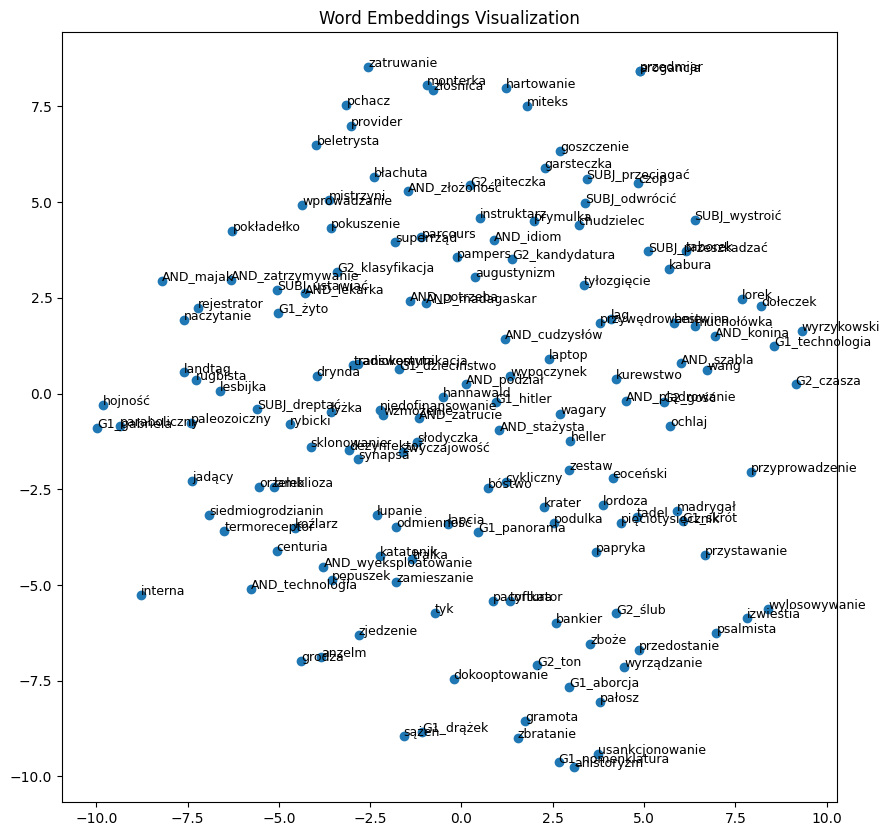

In [35]:
plot_embeddings_from_file("task1_embeddings.txt", num_words=150)

# Task 3 [3p]

Suppose that we have two languages: Upper and Lower. This is an example Upper sentence:

<pre>
THE QUICK BROWN FOX JUMPS OVER THE LAZY DOG.
</pre>

And this is its translation into Lower:

<pre>
the quick brown fox jumps over the lazy dog
</pre>

You have two corpora for these languages (with different sentences). Your task is to train word embedings for both languages together, so as to make embeddings of the words which are its translations as close as possible. But unfortunately, you have the budget which allows you to prepare the translation only for 1000 words (we call it D, you have to deside which words you want to be in D)

Prepare the corpora wich contains three kind of sentences:
* Upper corpus sentences
* Lower corpus sentences
* sentences derived from Upper/Lower corpus, modified using D

There are many possible ways of doing this, for instance this one (ROT13.COM: hfr rirel fragrapr sebz obgu pbecben gjvpr: jvgubhg nal zbqvsvpngvbaf, naq jvgu rirel jbeqf sebz Q ercynprq ol vgf genafyngvba)

We define the score for an Upper WORD as  $\frac{1}{p}$, where $p$ is a position of its translation in the list of **Lower** words most similar to WORD. For instance, when most similar words to DOG are:

<pre>
WOLF, CAT, WOLVES, LION, gopher, dog
</pre>

then the score for the word DOG is 0.5. Compute the average score separately for words from D, and for words out of D (hint: if the computation takes to much time do it for a random sample).

Present embedding using the PCA method or t-SNE. You can use sklearn or any other library for this.


In [2]:
import random
from collections import Counter
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
from sklearn.manifold import TSNE

with open("task3_polish_upper.txt", encoding="utf-8") as f:
    upper_corpus = [line.strip() for line in f if line.strip()]

with open("task3_polish_lower.txt", encoding="utf-8") as f:
    lower_corpus = [line.strip() for line in f if line.strip()]

def get_most_frequent_words(corpus, k=1000):
    words = " ".join(corpus).split()
    return [word for word, _ in Counter(words).most_common(k)]

D_upper = get_most_frequent_words(upper_corpus, 1000)
D = {w: w.lower() for w in D_upper}

def generate_hybrid_sentences(corpus, dictionary):
    hybrid = []
    for sentence in corpus:
        words = sentence.split()
        new_words = [dictionary.get(w, w) for w in words]
        hybrid.append(" ".join(new_words))
    return hybrid

hybrid_corpus = generate_hybrid_sentences(upper_corpus, D)
combined_corpus = upper_corpus + lower_corpus + hybrid_corpus
tokenized = [sentence.split() for sentence in combined_corpus]

model = Word2Vec(sentences=tokenized, vector_size=100, window=5, min_count=2, workers=4)

def translation_score(word, model):
    try:
        similar = model.wv.most_similar(word)
        for i, (w, _) in enumerate(similar, 1):
            if w == word.lower():
                return 1 / i
        return 0
    except KeyError:
        return 0

in_D = list(D.keys())
not_in_D = [w for w in model.wv.key_to_index if w.isupper() and w not in D]
not_in_D_sample = random.sample(not_in_D, min(1000, len(not_in_D)))

scores_D = [translation_score(w, model) for w in in_D if w in model.wv]
scores_not_D = [translation_score(w, model) for w in not_in_D_sample if w in model.wv]

print(f"Average score for words in D: {sum(scores_D)/len(scores_D):.4f}")
print(f"Average score for words not in D: {sum(scores_not_D)/len(scores_not_D):.4f}")


Average score for words in D: 0.3196
Average score for words not in D: 0.0309


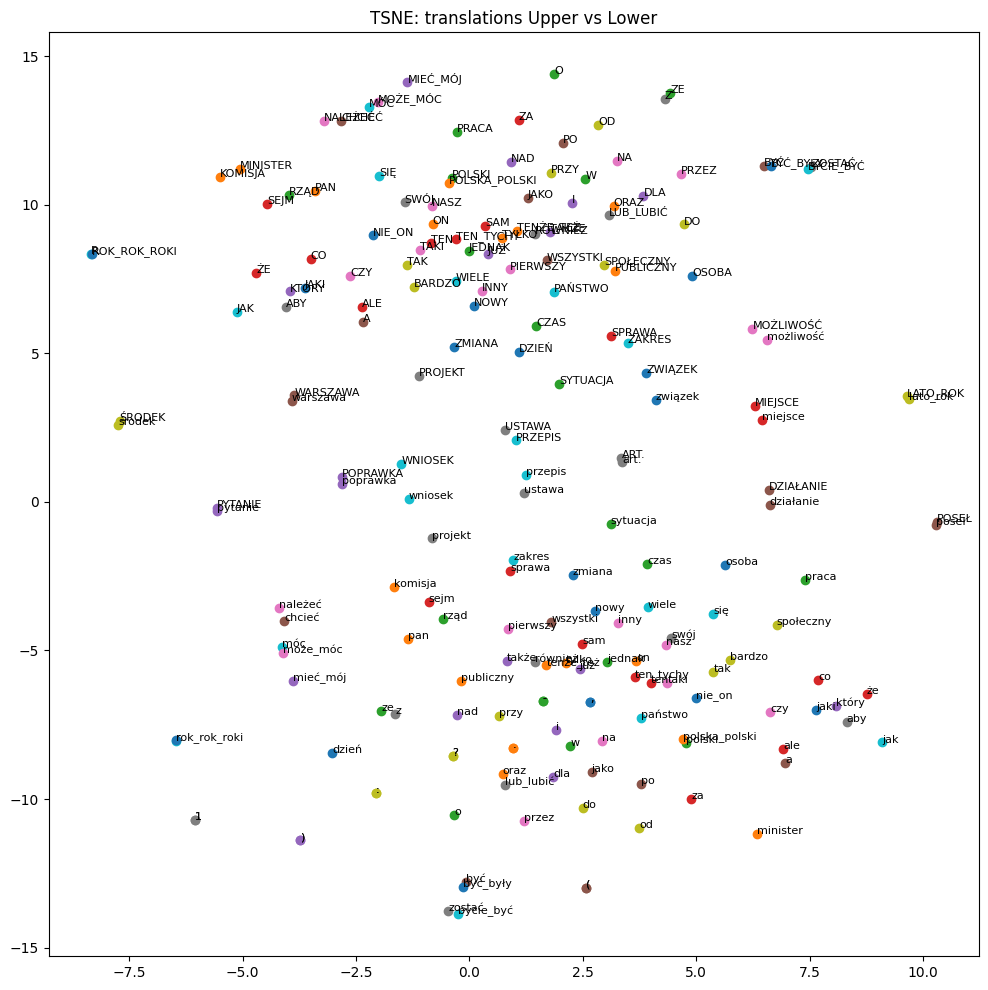

In [5]:

words_vis = in_D[:100] + [w.lower() for w in in_D[:100]]
vectors_vis = np.array([model.wv[w] for w in words_vis if w in model.wv])

tsne = TSNE(n_components=2, random_state=0, perplexity=30)
reduced = tsne.fit_transform(vectors_vis)

plt.figure(figsize=(12, 12))
for i, word in enumerate(words_vis[:len(reduced)]):
    plt.scatter(reduced[i, 0], reduced[i, 1])
    plt.annotate(word, (reduced[i, 0], reduced[i, 1]), fontsize=8)
plt.title("TSNE: translations Upper vs Lower")
plt.show()